# Wine Quality Analysis

<img src="https://thumbor.forbes.com/thumbor/fit-in/1200x0/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fdam%2Fimageserve%2F1133888244%2F0x0.jpg%3Ffit%3Dscale" width="600px" />

This notebook analyse a database of **red** and **white** variants of the Portuguese "Vinho Verde" wine based on wine **physicochemical test results** and quality scores that experts assign to each wine sample.

In [1]:
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_theme(style='whitegrid')

wineBarColors = ['#ecf0f1', '#e74c3c']
wineBinColors = ['#f39c12', '#c0392b'] #95a5a6

wineBarPalette = sns.color_palette(wineBarColors)
wineBinPalette = sns.color_palette(wineBinColors)

In [3]:
raw_df = pd.read_csv('data/winequalityN.csv')

full_df = raw_df.copy()

# Database Overview

In [4]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [5]:
full_df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [6]:
full_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6487.0,7.216579,1.296750,3.80000,6.40000,7.00000,7.70000,15.90000
volatile acidity,6489.0,0.339691,0.164649,0.08000,0.23000,0.29000,0.40000,1.58000
citric acid,6494.0,0.318722,0.145265,0.00000,0.25000,0.31000,0.39000,1.66000
residual sugar,6495.0,5.444326,4.758125,0.60000,1.80000,3.00000,8.10000,65.80000
chlorides,6495.0,0.056042,0.035036,0.00900,0.03800,0.04700,0.06500,0.61100
free sulfur dioxide,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
total sulfur dioxide,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
density,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
pH,6488.0,3.218395,0.160748,2.72000,3.11000,3.21000,3.32000,4.01000
sulphates,6493.0,0.531215,0.148814,0.22000,0.43000,0.51000,0.60000,2.00000


In [7]:
num_features = [f for f in full_df.columns if full_df.dtypes[f] != 'object']
num_features.remove('quality')

num_features

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']

## Missing Values

In [8]:
full_df.isnull().sum().sort_values(ascending=False)

fixed acidity           10
pH                       9
volatile acidity         8
sulphates                4
citric acid              3
chlorides                2
residual sugar           2
quality                  0
alcohol                  0
density                  0
total sulfur dioxide     0
free sulfur dioxide      0
type                     0
dtype: int64

In [9]:
full_df['pH'] = full_df.groupby(['type'])['pH'].transform(lambda x: x.fillna(x.mode()[0]))
full_df['chlorides'] = full_df.groupby(['type'])['chlorides'].transform(lambda x: x.fillna(x.mode()[0]))
full_df['sulphates'] = full_df.groupby(['type'])['sulphates'].transform(lambda x: x.fillna(x.mode()[0]))
full_df['residual sugar'] = full_df.groupby(['type'])['residual sugar'].transform(lambda x: x.fillna(x.mode()[0]))

for feature in ['fixed acidity', 'volatile acidity', 'citric acid']:
    full_df[feature] = full_df.groupby(['type', 'pH'])[feature].transform(lambda x: x.fillna(x.median()))

In [10]:
full_df.isnull().sum().sort_values(ascending=False)

quality                 0
alcohol                 0
sulphates               0
pH                      0
density                 0
total sulfur dioxide    0
free sulfur dioxide     0
chlorides               0
residual sugar          0
citric acid             0
volatile acidity        0
fixed acidity           0
type                    0
dtype: int64

## Wine Quality Distribution

**Wine quality** measures from **3 to 9** according to the observations in the training set. **Wine quality 5, 6 and 7** were the most frequent:

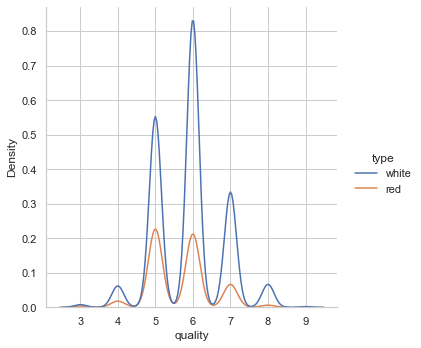

In [11]:
sns.displot(data=full_df, x='quality', hue='type', kind='kde')

With this we would like to simplify quality analys by adding **low**, **average** and **high quality** groups:

In [12]:
def impute_quality_group(quality):
    if quality <= 5:
        return 0 # low
    if quality > 5 and quality < 7:
        return 1 # average
    if quality >= 7:
        return 2 # high

full_df['quality_group'] = full_df['quality'].apply(impute_quality_group)

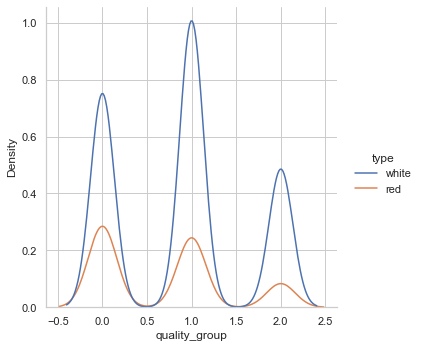

In [13]:
sns.displot(data=full_df, x='quality_group', hue='type', kind='kde')

In [14]:
full_df['quality_group'].value_counts()

1    2836
0    2384
2    1277
Name: quality_group, dtype: int64

# Data Transformation

By taking a look at dataset, we can see a lot of **right skewed distributions** (fixed and volatile acidity, residual sugar, chlorides, free and total SO2, density):

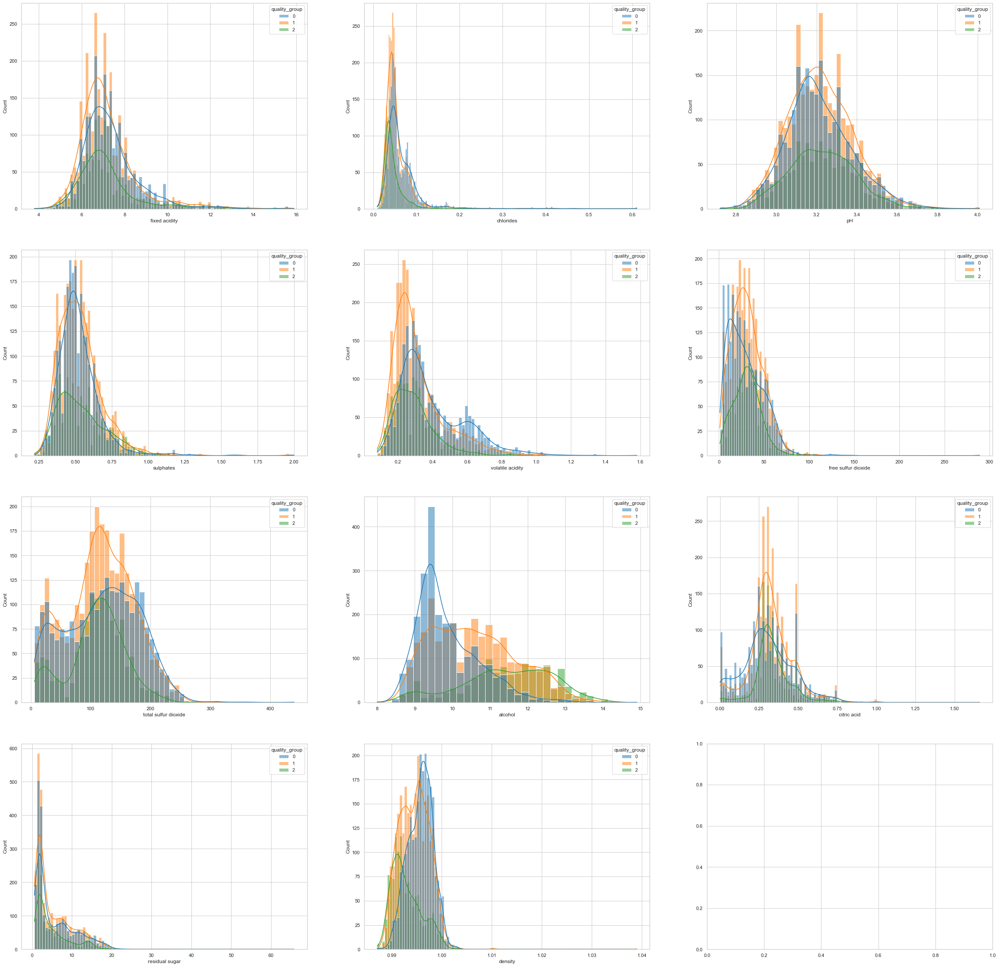

In [15]:
_, ax = plt.subplots(4, 3, figsize=(40, 40))

for idx, feature in enumerate(num_features):
    subplot = ax[idx % 4][idx % 3]
    sns.histplot(data=full_df, x=feature, hue='quality_group', kde=True, palette='tab10', ax=subplot)

Let's estimate each feature distribution **skewness and kurtosis** on the original dataset and after applying the most common data transformations (Box-Cox, log and principal square root):

In [16]:
skewness_df = pd.DataFrame({
    'feature': [], 
    'skewness': [], 
    'kurtosis': [], 
    'boxcox_test': [],
    'boxcox_skewness': [], 
    'boxcox_kurtosis': [],
    'log_skewness': [],
    'log_kurtosis': [],
    'sqrt_skewness': [],
    'sqrt_kurtosis': [],
})

transformed_df = full_df.copy()

for feature in num_features:
    skewness = transformed_df[feature].skew()
    kurtosis = transformed_df[feature].kurtosis()
    transformed_df[feature + '_transformed'], boxcox_test = stats.boxcox(1 + full_df[feature])

    boxcox_skewness = transformed_df[feature + '_transformed'].skew()
    boxcox_kurtosis = transformed_df[feature + '_transformed'].kurtosis()

    transformed_df[feature + '_transformed'] = np.log1p(transformed_df[feature])
    log_skewness = transformed_df[feature + '_transformed'].skew()
    log_kurtosis = transformed_df[feature + '_transformed'].kurtosis()

    transformed_df[feature + '_transformed'] = np.sqrt(transformed_df[feature])
    sqrt_skewness = transformed_df[feature + '_transformed'].skew()
    sqrt_kurtosis = transformed_df[feature + '_transformed'].kurtosis()

    skewness_df = skewness_df.append({
            'feature': feature, 
            'skewness': skewness, 
            'kurtosis': kurtosis, 
            'boxcox_test': boxcox_test,
            'boxcox_skewness': boxcox_skewness, 
            'boxcox_kurtosis': boxcox_kurtosis,
            'log_skewness': log_skewness, 
            'log_kurtosis': log_kurtosis,
            'sqrt_skewness': sqrt_skewness, 
            'sqrt_kurtosis': sqrt_kurtosis,
        }, 
        ignore_index=True
    )

skewness_df

,feature,skewness,kurtosis,boxcox_test,boxcox_skewness,boxcox_kurtosis,log_skewness,log_kurtosis,sqrt_skewness,sqrt_kurtosis
0,fixed acidity,1.724050,5.065950,-1.638639,-0.063140,1.084725,0.977247,2.105522,1.287515,3.129435
1,volatile acidity,1.496947,2.833215,-3.932056,0.113458,-0.571290,1.128569,1.190843,0.889966,0.636082
2,citric acid,0.473389,2.403767,0.184961,0.007853,1.195088,-0.087243,1.080812,-1.217014,3.018181
3,residual sugar,1.435299,4.358566,-0.428796,0.136541,-1.353319,0.414781,-1.160801,0.715961,-0.526337
4,chlorides,5.400690,50.909828,-23.281395,0.188790,-0.288641,4.485249,35.613057,2.420058,12.105333
5,free sulfur dioxide,1.220066,7.906238,0.435921,-0.036872,-0.128245,-0.721434,0.124574,0.031387,0.012355
6,total sulfur dioxide,-0.001177,-0.371664,0.861897,-0.174487,-0.457658,-1.350357,1.274064,-0.652641,-0.205032
7,density,0.503602,6.606067,-48.558080,0.000000,0.000000,0.485163,6.302020,0.485225,6.303355
8,pH,0.388063,0.373130,-2.258464,-0.000835,0.026514,0.265041,0.201801,0.307237,0.255421
9,sulphates,1.798601,8.664674,-3.086715,0.009976,-0.112599,1.099445,3.193944,0.970261,2.754036


Kurtosis is a heaviness of distirbution tails which is basically outliers. **Chlorides**, **sulphates**, **free SO2**, **fixed acidity**, **residual sugar** has large kurtosis and we want to take a look at their outliers. 

**Box-Cox transformation** performs great for most of the features. 
**Density** is an exception. It has a small deviation (~0.002) and all values are ~0.99. Probably, this is the reason, why Box-Cox transformation replaces density values by constant. 

Let's skip **density** and use Box-Cox transformation for the rest of the features:

In [17]:
features_to_transform = list(num_features)
features_to_transform.remove('density')

for feature in features_to_transform:
    full_df[feature], _ = stats.boxcox(1 + full_df[feature])

In [18]:
for feature in num_features:
    if feature + '_transformed' not in full_df:
        continue

    fig, ax = plt.subplots(2, 2, constrained_layout=True)
    
    # plot original distribution and its probability-probability plot
    sns.histplot(data=full_df, x=feature, hue='quality_group', kde=True, palette='tab10', ax=ax[0][0])
    stats.probplot(full_df[feature], dist=stats.norm, plot=ax[1][0])

    # plot transformed distribution and its probability-probability plot
    sns.histplot(data=full_df, x=feature + '_transformed', hue='quality_group', kde=True, palette='tab10', ax=ax[0][1])
    stats.probplot(full_df[feature + '_transformed'], dist=stats.norm, plot=ax[1][1]);

# Wine Physicochemical Analysis

## Wine Type

Our wine collection is represented in **red** and **white** wine types. Red and white wines are not only different because of the type of grapes and color. Actually, technology of producing these types of wine is quite different:

- **Red wines** are fermented with the **grape skins** and **seeds** and white wines are **not**. This is because all the color in red wine comes from the **skins and seeds of the grapes**.

- The largest difference between **red winemaking** and **white winemaking** is the oxidation that causes the wines to lose their floral and fruit notes in exchange for rich, nutty flavors and more smoothness.

More Info:
- https://winefolly.com/tips/red-wine-vs-white-wine-the-real-differences/
- https://www.healthline.com/nutrition/red-vs-white-wine

The training set is **imbalanced** with respect to wine types: there are much more red wines than white ones (75% vs 25%) and there are a few examples of bad (3) and exellent (9) wines:

In [19]:
full_df['quality'].value_counts()

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

In [20]:
full_df['type'].value_counts()

white    4898
red      1599
Name: type, dtype: int64

**Wine quality** doesn't seem to be dependent on the wine type:

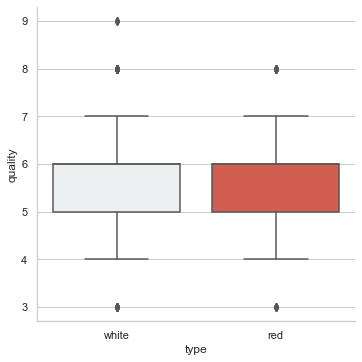

In [21]:
sns.catplot(data=full_df, x='type', y='quality', kind='box', palette=wineBarPalette)

However, it's reasonable to think that physicochemical test results for "good" and "bad" wines will be different and depends on wine type. So it may be helpful to **separate** our training set **by wine type** for further investigation:

In [22]:
red_wine_df = full_df[full_df['type'] == 'red']
white_wine_df = full_df[full_df['type'] == 'white']

Having wine type dataframes, we can see how **quality** of each type **correlates** with the rest of wine characteristics:

<AxesSubplot:>

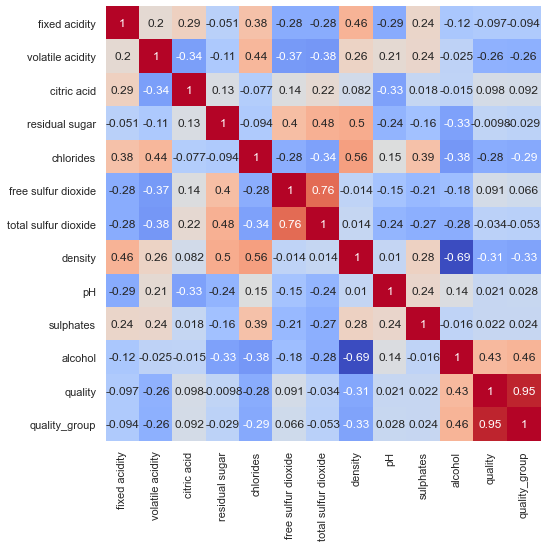

In [23]:
sns.heatmap(full_df.corr(), annot=True, square=True, cmap='coolwarm', cbar=False)

Text(0.5, 1.0, 'White Wine')

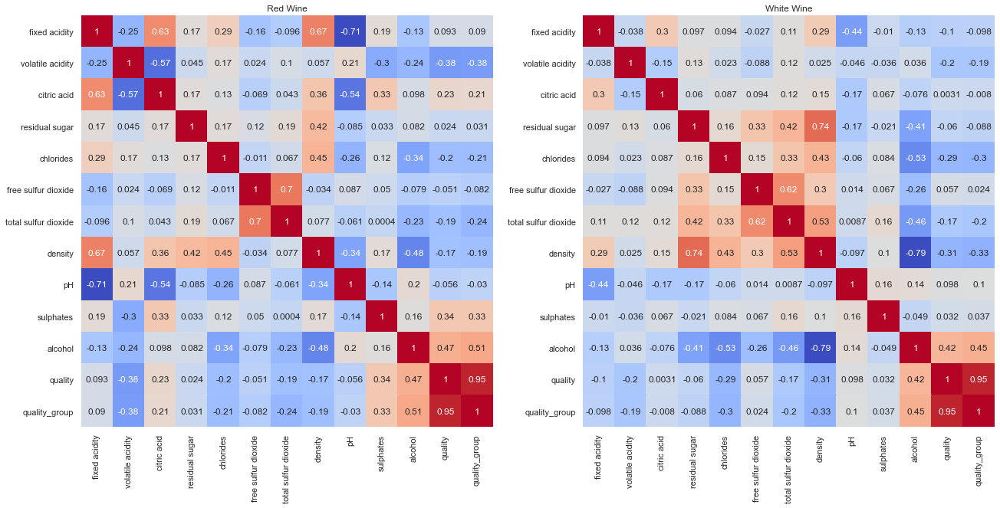

In [24]:
fig, (ax0, ax1) = plt.subplots(1, 2, constrained_layout=True, figsize=(18, 18))

sns.heatmap(red_wine_df.corr(), annot=True, square=True, cmap='coolwarm', cbar=False, ax=ax0)
ax0.set_title('Red Wine')

sns.heatmap(white_wine_df.corr(), annot=True, square=True, cmap='coolwarm', cbar=False, ax=ax1)
ax1.set_title('White Wine')

**Red Wine Quality Insights**:
- **Alchohol** has possitive correlation with **Quality** (0.48)
- **Sulphates** has possitive correlation with **Quality** (0.25)
- **Citric Acidity** has possitive correlation with **Quality** (0.23)
- **Fixed Acidity** has possitive correlation with **Quality** (0.12)
- **Chlorides** has negative correlation with **Quality** (-0.13)
- **Density** has negative correlation with **Quality** (-0.17)
- **Total Sulfure Dioxide** has negative correlation with **Quality** (-0.19)
- **Volatile Acidity** has negative correlation with **Quality** (-0.39)

**White Wine Quality Insights**:
- **Alchohol** has possitive correlation with **Quality** (0.44)
- **Fixed Acidity** has negative correlation with **Quality** (-0.11)
- **Total Sulfure Dioxide** has negative correlation with **Quality** (-0.17)
- **Volatile Acidity** has negative correlation with **Quality** (-0.19)
- **Chlorides** has negative correlation with **Quality** (-0.21)
- **Density** has negative correlation with **Quality** (-0.31)

## Acidity and pH

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/7/70/Wine_grape_diagram_en.svg/2560px-Wine_grape_diagram_en.svg.png" width="600px" />

The **acids** in wine are an important component in both winemaking and the finished product of wine. They are present in both **grapes and wine**, having direct influences on the **color, balance and taste** of the wine as well as the **growth and vitality of yeast** during fermentation and **protecting the wine from bacteria**. 

Here is acidity information we have been given:
- **fixed acidity** (tartaric acid - $g/dm^3$) - most acids involved with wine or fixed or nonvolatile (do not evaporate readily)
- **volatile acidity** (acetic acid - $g/dm^3$) - the amount of acetic acid in wine, which at too high of levels can lead to an unpleasant, vinegar taste
- **citric acid** ($g/dm^3$) - found in small quantities, citric acid can add "freshness" and flavor to wines
- **pH** - describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic); most wines are between 3-4 on the pH scale

More Info:
- https://waterhouse.ucdavis.edu/whats-in-wine/fixed-acidity
- http://www.oiv.int/public/medias/3732/oiv-ma-as313-02.pdf
- https://waterhouse.ucdavis.edu/whats-in-wine/volatile-acidity
- https://www.decanter.com/learn/volatile-acidity-va-45532/
- https://extension.psu.edu/volatile-acidity-in-wine

### Fixed Acidity

**Tartaric acid** is, from a winemaking perspective, the most important in wine due to the prominent role it plays in maintaining the chemical stability of the wine and its color and finally in influencing the taste of the finished wine.

Most of the **acids** involved with wine are **fixed acids** with the notable exception of **acetic acid**, mostly found in vinegar, which is volatile and can contribute to the wine fault known as volatile acidity.

**Fixed accidity** differently affects **red and white wine quality**:
- **Red wine** becomes better **quality** with increasing **fixed acidity**
- Conversing, **white wine** quality degrades with increasing **fixed acidity**

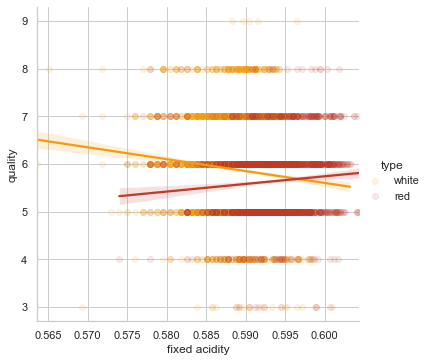

In [25]:
sns.lmplot(data=full_df, x='fixed acidity', y='quality', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})

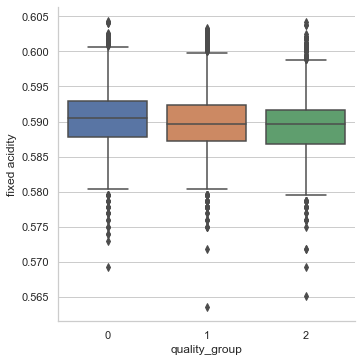

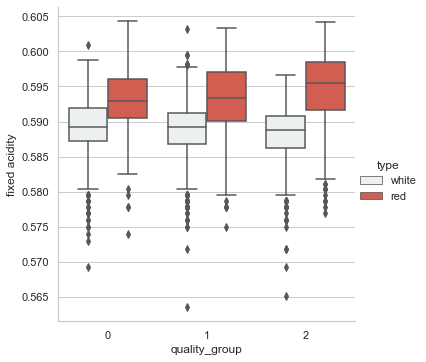

In [26]:
sns.catplot(data=full_df, x='quality_group', y='fixed acidity', kind='box')
sns.catplot(data=full_df, x='quality_group', y='fixed acidity', hue='type', kind='box', palette=wineBarPalette)

### Volatile Acidity

<img src="https://i.insider.com/5ef6191e5af6cc6d7604ae44?width=2000&format=jpeg&auto=webp" width="600px" />

**Volatile acidity** is mostly caused by bacteria in the wine creating acetic acid — the acid that gives vinegar its characteristic flavor and aroma — and its byproduct, ethyl acetate. It is only good if it's added intensionally to the wine production and in small dozes. Increasing in **volatile acidity** is killing **wine quality**:

**Wine quality** goes up when **volatile acidity** descreases:

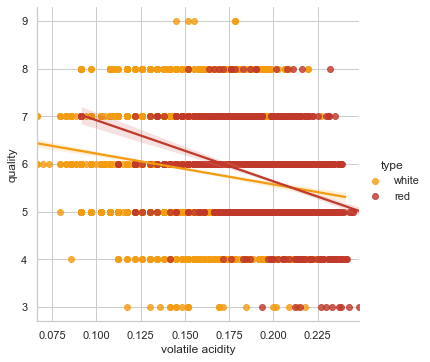

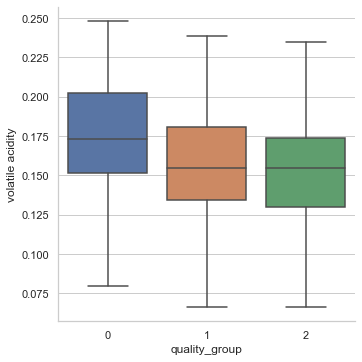

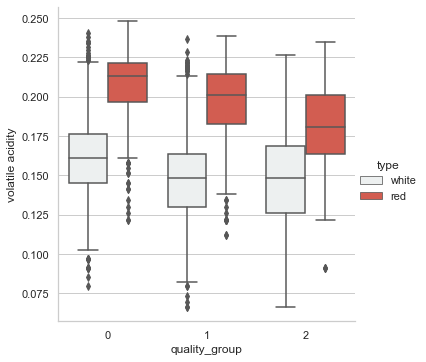

In [27]:
sns.lmplot(data=full_df, x='volatile acidity', y='quality', hue='type', palette=wineBinPalette)

sns.catplot(data=full_df, x='quality_group', y='volatile acidity', kind='box')
sns.catplot(data=full_df, x='quality_group', y='volatile acidity', hue='type', kind='box', palette=wineBarPalette)

**Volatile acidity** has pretty strong negative correlations with **citric acid**, **free and total SO2** content. They might prevent wine from bacterial activities that produces **volatile acidity**.

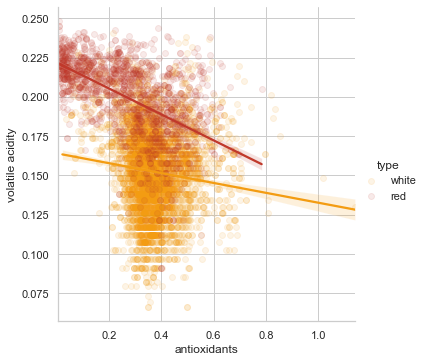

In [28]:
full_df['antioxidants'] = full_df['citric acid'] + full_df['total sulfur dioxide'] * 0.001

sns.lmplot(data=full_df, x='antioxidants', y='volatile acidity', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})

### Citric Acid

<img src="https://images-na.ssl-images-amazon.com/images/I/41VHzHjkVvL.jpg" width="600px" />

The **citric acid** is found in very small quantities in wine grapes. It can be used by winemakers in acidification to boost the **wine's total acidity** and prevent **ferric hazes**. It is used less frequently than **tartaric and malic** due to the aggressive **citric flavors** it can add to the wine. When **citric acid** is added, it is always done after primary alcohol fermentation has been completed due to the tendency of yeast to convert citric into acetic acid. 

More Info:
- https://wineserver.ucdavis.edu/industry-info/enology/methods-and-techniques/common-chemical-reagents/citric-acid

**Citric Acidity** improves **red wine quality** and has slightly negative impact on the **white wine quality**:

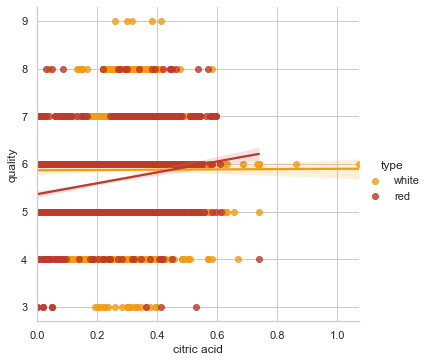

In [29]:
sns.lmplot(data=full_df, x='citric acid', y='quality', hue='type', palette=wineBinPalette)

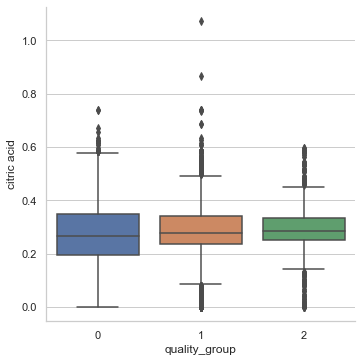

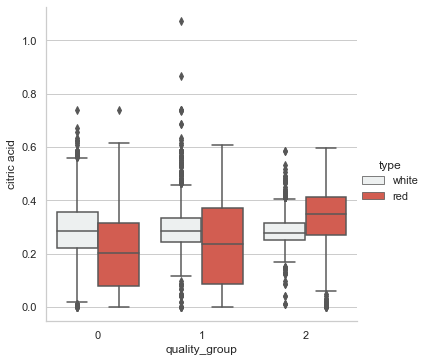

In [30]:
sns.catplot(data=full_df, x='quality_group', y='citric acid', kind='box')
sns.catplot(data=full_df, x='quality_group', y='citric acid', hue='type', kind='box', palette=wineBarPalette)

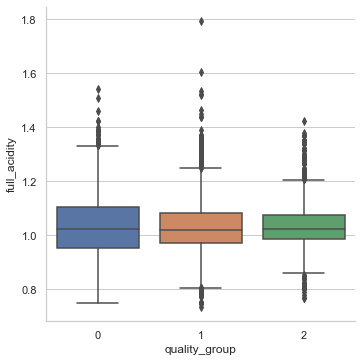

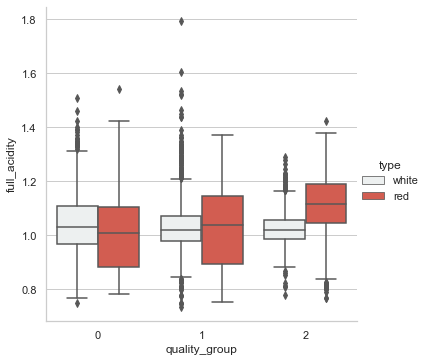

In [31]:
full_df['full_acidity'] = full_df['fixed acidity'] + full_df['volatile acidity'] + full_df['citric acid']

sns.catplot(data=full_df, x='quality_group', y='full_acidity', kind='box')
sns.catplot(data=full_df, x='quality_group', y='full_acidity', hue='type', kind='box', palette=wineBarPalette)

### pH test

<img src="https://253qv1sx4ey389p9wtpp9sj0-wpengine.netdna-ssl.com/wp-content/uploads/2019/06/PH_level_6.jpg" width="600px" />

**pH** stands for **power of hydrogen**, which is a measurement of the **hydrogen ion concentration** in the solution.

The **pH** scale runs from **0 to 14**, from **very acidic to very basic, or alkaline**. 
**pH** affects almost every aspect of the wine: flavor, aroma, color, and potentially even quality.

Lower **pH** numbers mean higher amounts of hydrogen ions, and therefore a **more acidic wine**. In comparison, lemon juice usually has a pH between 2 and 3, while orange juice and wine are generally between 3 and 4, with some wines reaching slightly beyond that, to high **2s or low 4s**. For each full point increase in pH, the level of acidity is 10 times more acidic as you go up, so the difference between a pH of 3 and a pH of 4 is very significant.

More Info:
- https://daily.sevenfifty.com/how-winemakers-analyze-ph-and-its-impact-on-wine/
- https://rstudio-pubs-static.s3.amazonaws.com/277109_1f7df6787d344858af90b5a5d6c1ef65.html

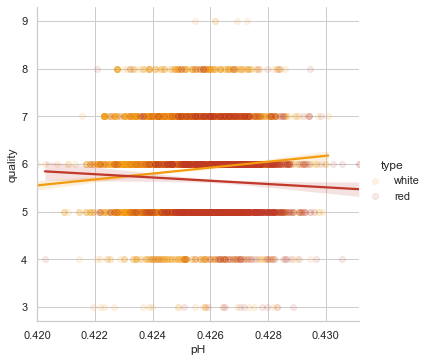

In [32]:
sns.lmplot(data=full_df, x='pH', y='quality', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})

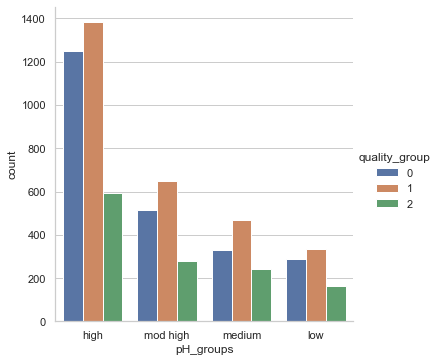

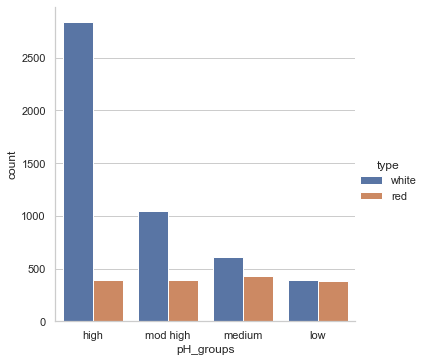

In [55]:
pH_labels = ['high', 'mod high', 'medium', 'low']
pH_bins = [2.5, 3.2, 3.3, 3.4, 4.1]

full_df['pH_groups'] = pd.cut(raw_df['pH'], bins=pH_bins, labels=pH_labels) 

sns.catplot(data=full_df, x='pH_groups', hue='quality_group', kind='count')
sns.catplot(data=full_df, x='pH_groups', hue='type', kind='count')

**pH** shows the same picture as **fixed acidity**. **Red wine quality** becomes higher with higher acidity (lower pH value) and **white wine quality** becomes higher as acidity reduces.

## Sugar, Alcohol and Density

<img src="https://upload.wikimedia.org/wikipedia/commons/d/d5/Mthomebrew_must.JPG" width="600px" />

The process of **fermentation** in winemaking turns grape juice into an alcoholic beverage. During fermentation, **yeasts** transform sugars present in the juice into ethanol and carbon dioxide. In winemaking, the temperature and speed of fermentation are important considerations as well as the levels of oxygen present in the must at the start of the fermentation.

Here is a list of wine properties related to **fermentation** process:

- **residual sugar** ($g/dm^3$) - the amount of **sugar** remaining after **fermentation stops**, it's rare to find wines with less than 1 gram/liter and wines with greater than 45 grams/liter are considered sweet
- **alcohol** (% by volume) - the percent alcohol content of the wine
- **density** ($g/cm^3$) - the density of water is close to that of water depending on the percent alcohol and sugar content

### Residual Sugar

<img src="https://media.winefolly.com/Residual-Sugar-wine.png" width="600px" />

**Residual sugar** is from natural grape sugars leftover in a wine after the alcoholic fermentation finishes. It defines wine's **sweetness**.

More Info:
- https://winefolly.com/deep-dive/what-is-residual-sugar-in-wine/

Here is a quick ranges of residual sugar by wine type:

**White Wine**:
- Total: 0.6-65.8 g/gm^3
- In Low Tier: 0.7-17.55 g/gm^3
- In High Tier: 0.8-14.8 g/gm^3

**Red Wine**:
- Total: 0.9-15.5 g/dm^3
- In Low Tier: 1.2-12.9 g/dm^3
- In High Tier: 1.4-6.4 g/dm^3

**Resigual sugar** has slightly possitive correlation with **red wine quality** and slightly negative correlation with **white wine quality**.

In [34]:
red_wine_df[red_wine_df['quality_group'] == 2]['residual sugar'].describe()

count    217.000000
mean       0.964259
std        0.157395
min        0.669006
25%        0.876111
50%        0.934416
75%        1.001330
max        1.459492
Name: residual sugar, dtype: float64

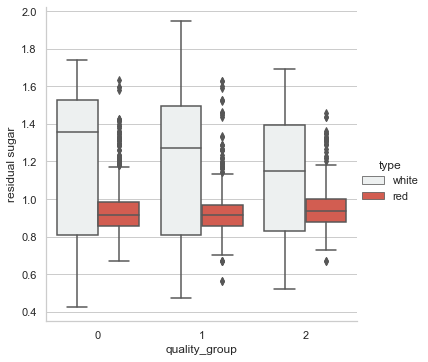

In [35]:
sns.catplot(data=full_df, x='quality_group', y='residual sugar', hue='type', kind='box', palette=wineBarPalette)

**Acidity and sweetness** are two of five principal characteristics of the wine. We can combine them in **sugar to acidity ratio**. Sugar can soft sour taste of wine:

More Info:
- https://winefolly.com/deep-dive/understanding-acidity-in-wine/

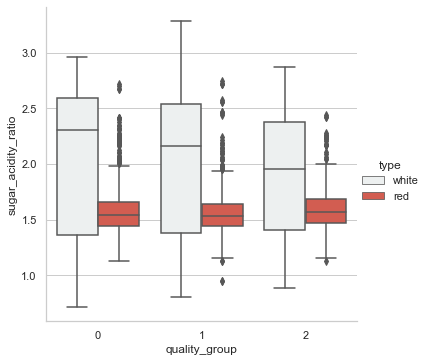

In [36]:
full_df['sugar_acidity_ratio'] = full_df['residual sugar'] / full_df['fixed acidity']

sns.catplot(data=full_df, x='quality_group', y='sugar_acidity_ratio', hue='type', kind='box', palette=wineBarPalette)

<img src="https://i.pinimg.com/originals/a9/52/3d/a9523d5cf4bf0a7dc5e8db5e703f3f52.jpg" width="600px" />

**Residual sugar** can be useful to group wine by **sweetness**. **Sweetness** is one of the five key wine characteristics:

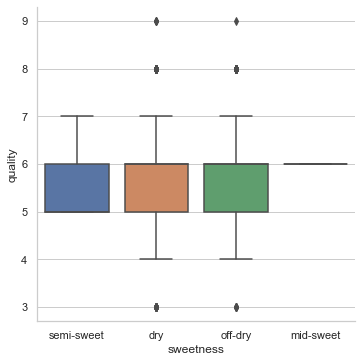

In [56]:
def impute_sweetness(residual_sugar):
    if residual_sugar < 9:
        return 'dry'
    if residual_sugar >= 9 and residual_sugar < 18:
        return 'off-dry'
    if residual_sugar >= 18 and residual_sugar < 50:
        return 'semi-sweet'
    if residual_sugar >= 50 and residual_sugar < 120:
        return 'mid-sweet'
    if residual_sugar >= 120:
        return 'sweet'

full_df['sweetness'] = raw_df['residual sugar'].apply(impute_sweetness)

sns.catplot(data=full_df, x='sweetness', y='quality', kind='box')

### Percentage of Alcohol

**Percentage of alcohol** has a great possitive correlation with **wine quality**:

In [57]:
raw_df['alcohol'].describe()

count    6497.000000
mean       10.491801
std         1.192712
min         8.000000
25%         9.500000
50%        10.300000
75%        11.300000
max        14.900000
Name: alcohol, dtype: float64

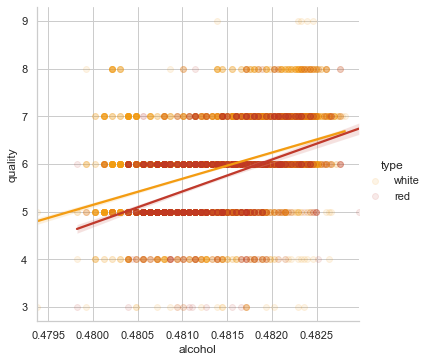

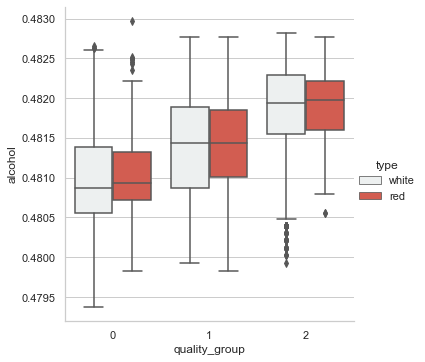

In [39]:
sns.lmplot(data=full_df, x='alcohol', y='quality', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})
sns.catplot(data=full_df, x='quality_group', y='alcohol', hue='type', kind='box', palette=wineBarPalette)

**Alcohol** content is created from **sugar**. Generally, the **more alcohol wine** contains, the **less residual sugar** it has (**-0.54** correlation):

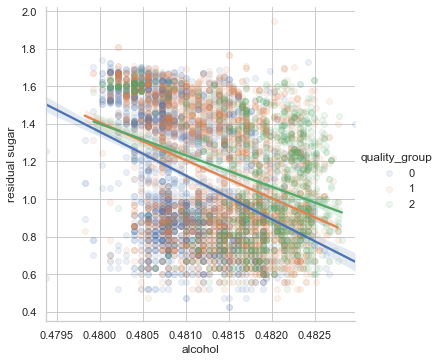

In [40]:
sns.lmplot(data=full_df, x='alcohol', y='residual sugar', hue='quality_group', scatter_kws={'alpha': 0.1})

Generally, wines contains **9-11% of alcohol**. Let's group our samples in 3 tiers:

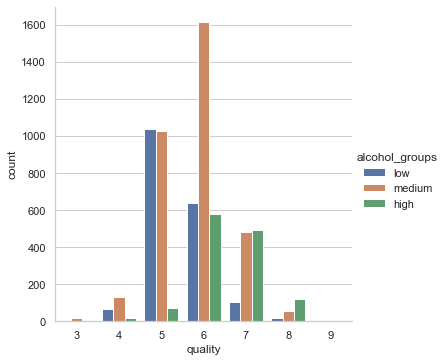

In [58]:
alcohol_labels = ['low', 'medium', 'high']
alcohol_bins = [0, 9.5, 11.5, 20]

full_df['alcohol_groups'] = pd.cut(raw_df['alcohol'], bins=alcohol_bins, labels=alcohol_labels) 

sns.catplot(data=full_df, x='quality', hue='alcohol_groups', kind='count')

<img src="https://media.winefolly.com/wine-body-infographic-winefolly-2.png" width="600px" />

**Wine body** is defined by how heavy and rich a wine tastes. It’s a combination of several factors: grape variety, alcohol level, and even sweetness level. We have information about **acidity** and **acholol** level, so let's intersect them:

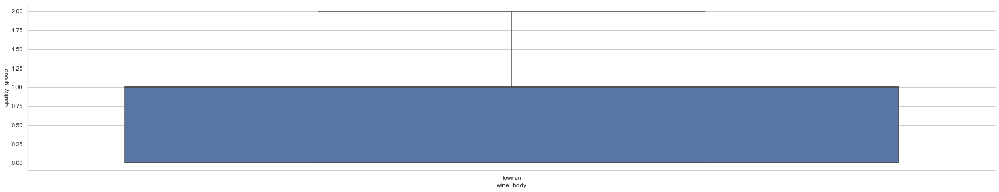

In [42]:
full_df['wine_body'] = full_df['alcohol_groups'].astype(str) + full_df['pH_groups'].astype(str)

g = sns.catplot(data=full_df, x='wine_body', y='quality_group', kind='box')
g.fig.set_figwidth(30)

### Density

**Density** is generally used as a measure of the **conversion of sugar to alcohol**. Prior to fermentation, wine will contain **sugars** which will make the liquid more **dense**. When the **wine** is undergoing fermentation the **sugars** in the liquid are converted by the yeast into **alcohol**. **Alcohol in water** is **less dense** than sugar in water:

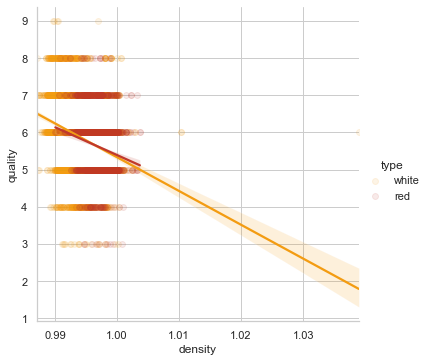

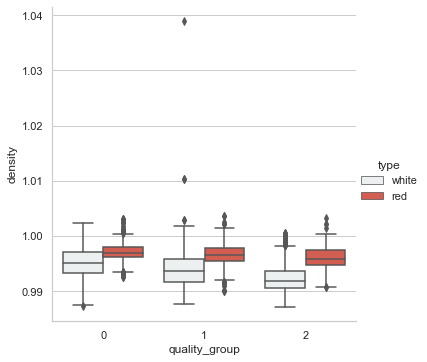

In [43]:
sns.lmplot(data=full_df, x='density', y='quality', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})
sns.catplot(data=full_df, x='quality_group', y='density', hue='type', kind='box', palette=wineBarPalette)

**Residual sugar** is what makes wine **dense**. Their corralation is pretty strong (**0.54**). Scatter plot shows **two outliers** with high amount of sugar and desity. The **residual sugar** and **dense** relations are **heterogeneous**:

<AxesSubplot:xlabel='density', ylabel='residual sugar'>

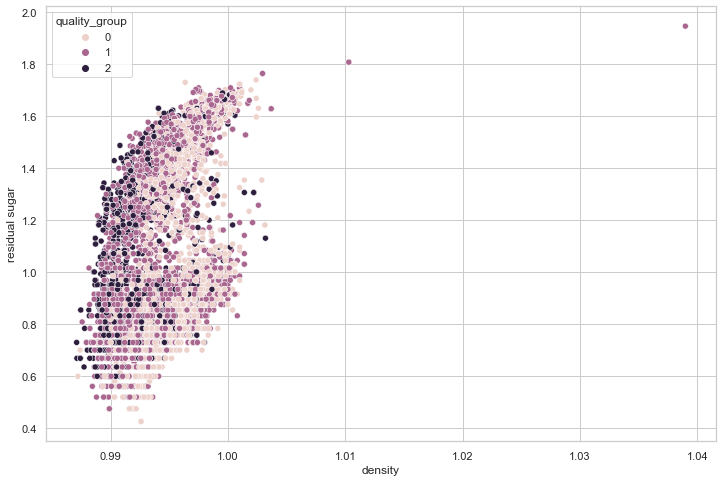

In [44]:
sns.scatterplot(data=full_df, x='density', y='residual sugar', hue='quality_group')

## Sulfur Dioxide and Sulphates

<img src="https://grapesandwine.cals.cornell.edu/sites/grapesandwine.cals.cornell.edu/files/shared/images/101Fig1300.jpg" width="600px" />

**Sulfites** help preserve wine and slow chemical reactions, which cause a wine to go bad. Experts believe that **higher sulfurous** content causes a **duller taste** in wine, and that high potency of **sulfite ions** presents a health risk and speeds up the wine’s fermentation process. This suggests that **higher sulphate** contents tend to correspond with **lower wine quality**. 

The presence of another type of sulfate, **sulfur dioxide**, is thought to help rid the wine of a wide variety of bacteria (good and bad); this seems to **lower the wine quality as well** because it dulls the wine’s fermentation process.

- **free sulfur dioxide** ($mg/dm^3$) - the free form of $SO_{2}$ exists in equilibrium between molecular $SO_{2}$ (as a dissolved gas) and bisulfite ion; it prevents microbial growth and the oxidation of wine
- **total sulfur dioxide** ($mg/dm^3$) - amount of free and bound forms of $SO_{2}$; in low concentrations, $SO_{2}$ is mostly undetectable in wine, but at free $SO_{2}$ concentrations over 50 ppm, $SO_{2}$ becomes evident in the nose and taste of wine
- **sulphates** (potassium sulphate - $g/dm^3$) - a wine additive which can contribute to sulfur dioxide gas ($SO_{2}$) levels, wich acts as an antimicrobial and antioxidant

More Info:
- https://www.decanter.com/learn/wine-terminology/sulfites-in-wine-friend-or-foe-295931/
- https://link.springer.com/chapter/10.1007/978-1-4757-6255-6_12
- https://winefolly.com/deep-dive/sulfites-in-wine/
- https://www.healthline.com/nutrition/sulfites-in-wine

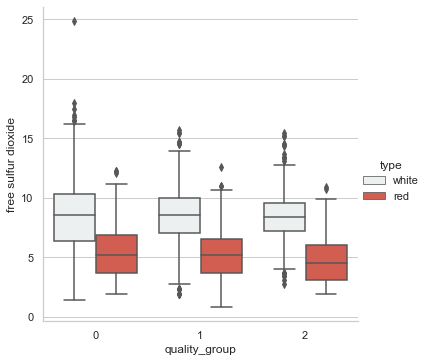

In [45]:
sns.catplot(data=full_df, x='quality_group', y='free sulfur dioxide', hue='type', kind='box', palette=wineBarPalette)

<AxesSubplot:xlabel='total sulfur dioxide', ylabel='free sulfur dioxide'>

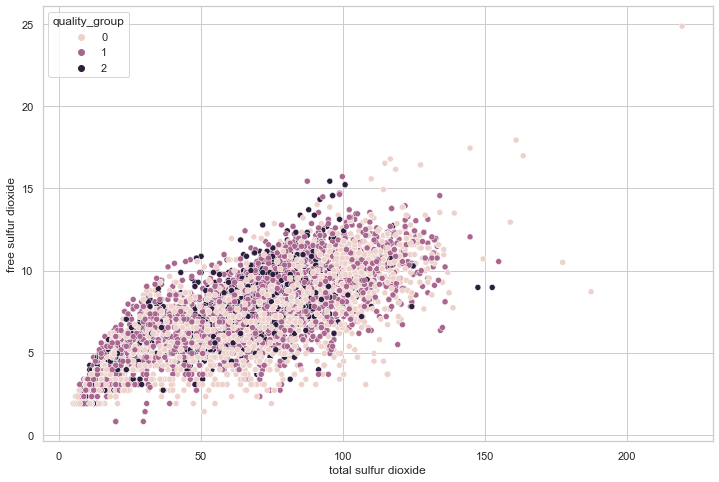

In [46]:
sns.scatterplot(data=full_df, x='total sulfur dioxide', y='free sulfur dioxide', hue='quality_group')

**Total SO2** consists of **Free SO2** and **Bounded SO2** (combined with compounds such as phenols, acetaldehyde and sugar).

**White wine** contains more **bounded SO2** then **red wine**. Both type of wines tends to have **less bounded SO2** when samples quality goes up:

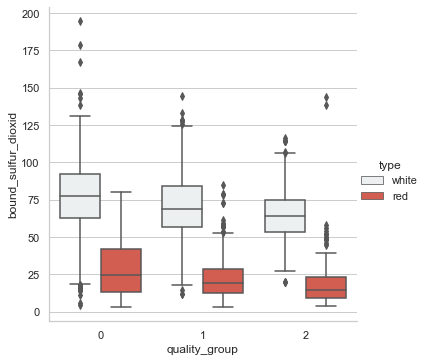

In [47]:
full_df['bound_sulfur_dioxid'] = full_df['total sulfur dioxide'] - full_df['free sulfur dioxide']

sns.catplot(data=full_df, x='quality_group', y='bound_sulfur_dioxid', hue='type', kind='box', palette=wineBarPalette)

**Free and total SO2** can be combined by ratio. Better tast wine had larger **free SO2** ratio:

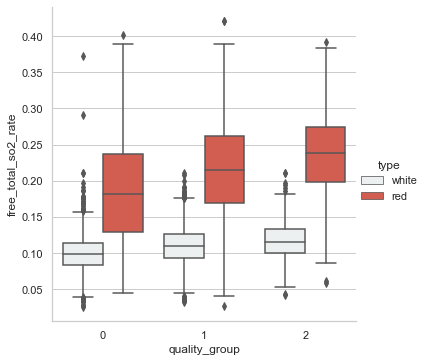

In [48]:
full_df['free_total_so2_rate'] = full_df['free sulfur dioxide'] / full_df['total sulfur dioxide']

sns.catplot(data=full_df, x='quality_group', y='free_total_so2_rate', hue='type', kind='box', palette=wineBarPalette)

**Free SO2** consists of **molecular SO2**, **bisulfite ions (HSO3-)** and **sulfite (SO3+)**. **Molecular SO2** is directly active in
preventing oxidation and spoilage. Bisulfites and sulfites are much less reactive components.

The effectiveness of the $SO_2$ to protect the wine from oxidation and microbial spoilage is **dependant upon the pH** of the wine. 
Therefore, the **higher the pH** a wine has, the **less effective the SO2**. Wines with higher pH levels, red or white, may require too high a total SO2 level to achieve desired free $SO_2$ levels.

Rather than have excessive **bound SO2** (which may give a “chemical” taste), it is best to rely on a combination of factors, including susceptibility to spoilage. Some pH problems can be relieved by adjusting the pH downward with tartaric acid.

More Info:
- http://www.santarosa.edu/~jhenderson/Sulfur%20Dioxide.pdf
- http://srjcstaff.santarosa.edu/~jhenderson/SO2.pdf

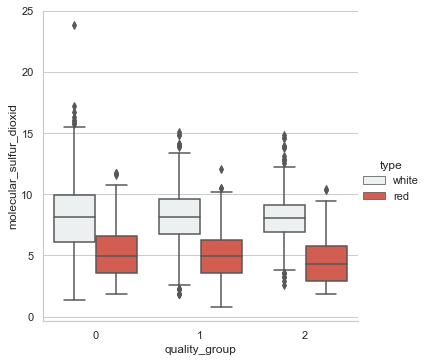

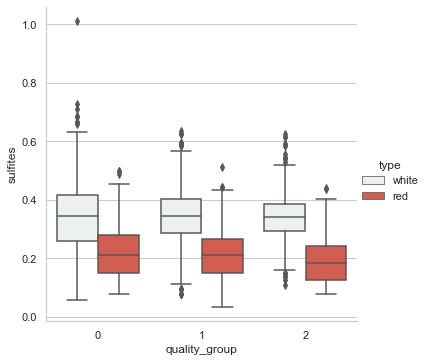

In [49]:
full_df['molecular_sulfur_dioxid'] = full_df['free sulfur dioxide'] / (1 + 10 ** (full_df['pH'] - 1.8))
full_df['sulfites'] = full_df['free sulfur dioxide'] - full_df['molecular_sulfur_dioxid']

sns.catplot(data=full_df, x='quality_group', y='molecular_sulfur_dioxid', hue='type', kind='box', palette=wineBarPalette)
sns.catplot(data=full_df, x='quality_group', y='sulfites', hue='type', kind='box', palette=wineBarPalette)

**Molecular SO2** and **sulfites** tended to be less in the **higher quality wines**.

### Sulphates

**Sulphates** are salts of sulfuric acid (that's why it has **negative correlation** with **SO2** amount). Sulfur dioxide reacts other chemical compounds (metabolites) in wine to create sulphite compounds, which heavily characterise the **chemical profile of the oldest wines**. It also adds a bit of a “sharp” taste:

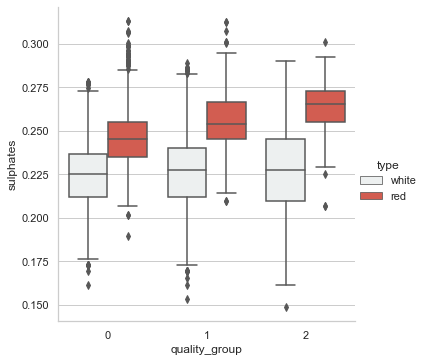

In [50]:
sns.catplot(data=full_df, x='quality_group', y='sulphates', hue='type', kind='box', palette=wineBarPalette)

**Red wine** tends to have higher content of **sulfates** comparing with **white wine**. **Sulfates** slightly correlates with **wine quality**.

## Chlorides

**Chloride** concentration in the wine is influenced by **geographic** and its highest levels are found in wines coming from countries where irrigation is carried out using **salty water** or in areas with brackish terrains.

**Chlorides** (**sodium chloride** - $g/dm^3$) - the amount of **salt** in the wine

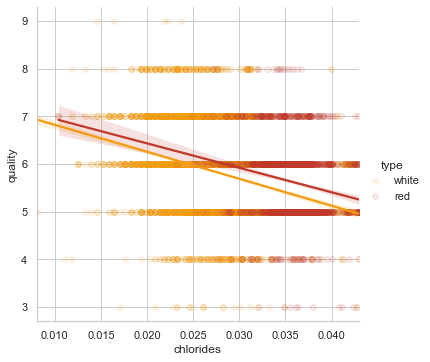

In [51]:
sns.lmplot(data=full_df, x='chlorides', y='quality', hue='type', palette=wineBinPalette, scatter_kws={'alpha': 0.1})

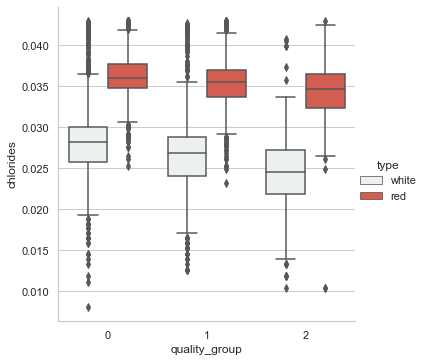

In [52]:
sns.catplot(data=full_df, x='quality_group', y='chlorides', hue='type', kind='box', palette=wineBarPalette)

**Chlorides** content **decrease** as **wine quality goes up**.

# Feature Engineering

In [53]:
#import itertools

#num_features = [f for f in full_df.columns if full_df.dtypes[f] != 'object']
#num_features.remove('quality')

#features_to_expolore = ['density', 'alcohol', 'free sulfur dioxide', 'chlorides', 'pH', 'residual sugar']

#for feature1, feature2 in itertools.combinations(features_to_expolore, 2):
    #full_df[feature1 + '_min_' + feature2] = full_df[feature1] - full_df[feature2]
    #full_df[feature1 + '_mul_' + feature2] = full_df[feature1] * full_df[feature2]
    #full_df[feature1 + '_div_' + feature2] = full_df[feature1] / full_df[feature2]
    #print(feature1, feature2)

In [54]:
#full_df.corr()['quality'].sort_values(ascending=True)[:-25]

## Credits

- https://bibinmjose.github.io/RedWineDataAnalysis/
- https://s3.amazonaws.com/udacity-hosted-downloads/ud651/wineQualityInfo.txt
- https://towardsdatascience.com/what-makes-a-wine-good-ea370601a8e4
- https://www.kaggle.com/mgmarques/wines-type-and-quality-classification-exercises